In [8]:
import os
import re
import pickle
import shutil
from functions import *
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Set consistent color scheme
sns.set_palette("husl")
NODE_COLOR = '#6baed6'  # Soft blue
EDGE_CMAP = plt.cm.viridis  # Colormap for weighted edges
NODE_CMAP = plt.cm.YlOrRd  # Colormap for node metrics

# Working with the character networks

In [9]:
path = 'graphs'
unweighted = 'dg_characters.pickle'
weighted = 'dgw_characters.pickle'

In [10]:
# Load the graphs
def load_graphs(graph: str, path: str = 'graphs'):
    with open(os.path.join(path,graph), 'rb') as f:
        loaded_graph = pickle.load(f)
    
    return loaded_graph

In [11]:
dg_char = load_graphs(unweighted)
print(f"\nUnweighted character network complete!")
print(f"  Nodes: {dg_char.number_of_nodes()}")
print(f"  Edges: {dg_char.number_of_edges()}")
dgw_char = load_graphs(weighted)
print(f"\nUnweighted character network complete!")
print(f"  Nodes: {dgw_char.number_of_nodes()}")
print(f"  Edges: {dgw_char.number_of_edges()}")


Unweighted character network complete!
  Nodes: 847
  Edges: 10601

Unweighted character network complete!
  Nodes: 847
  Edges: 10601


## Looking at the nodes with highest in degrees

In [12]:
# Analyze most connected characters
char_degrees = dict(dg_char.degree())
top_chars = sorted(char_degrees.items(), key=lambda x: x[1], reverse=True)[:20]

print("Top 20 most connected characters (by degree):")
for i, (char, degree) in enumerate(top_chars, 1):
    print(f"{i}. {char}: {degree}")

Top 20 most connected characters (by degree):
1. Jon Snow: 299
2. Tyrion Lannister: 279
3. Daenerys Targaryen: 264
4. Eddard Stark: 236
5. Arya Stark: 236
6. Sansa Stark: 233
7. Jaime Lannister: 220
8. Robb Stark: 213
9. Cersei Lannister: 208
10. Stannis Baratheon: 187
11. Bran Stark: 186
12. Rhaenyra Targaryen: 177
13. Robert Baratheon: 171
14. Daemon Targaryen: 168
15. Catelyn Stark: 165
16. Tywin Lannister: 161
17. Joffrey Baratheon: 159
18. Theon Greyjoy: 154
19. Petyr Baelish: 148
20. Viserys I Targaryen: 146


In [13]:
# Get largest connected component and calculate centrality measures

largest_cc_unweighted = max(nx.weakly_connected_components(dg_char), key=len)
dg_char_main = dg_char.subgraph(largest_cc_unweighted).copy()

print(f"Largest weakly connected component: {dg_char_main.number_of_nodes()} nodes, {dg_char_main.number_of_edges()} edges")

# Calculate centrality measures
print("\nCalculating centrality measures...")
char_betweenness = nx.betweenness_centrality(dg_char_main)
char_closeness = nx.closeness_centrality(dg_char_main)
char_eigenvector = nx.eigenvector_centrality(dg_char_main, max_iter=1000)

print("\nTop 10 characters by betweenness centrality:")
for i, (char, bc) in enumerate(sorted(char_betweenness.items(), key=lambda x: x[1], reverse=True)[:10], 1):
    print(f"{i}. {char}: {bc:.6f}")

Largest weakly connected component: 818 nodes, 10392 edges

Calculating centrality measures...

Top 10 characters by betweenness centrality:
1. Daenerys Targaryen: 0.171725
2. Daemon Targaryen: 0.096394
3. Jon Snow: 0.082068
4. Arya Stark: 0.070056
5. Rhaenyra Targaryen: 0.061601
6. Eddard Stark: 0.054169
7. Yohn Royce: 0.053413
8. Tyrion Lannister: 0.047960
9. Andar Royce: 0.041424
10. Sansa Stark: 0.039489

Top 10 characters by betweenness centrality:
1. Daenerys Targaryen: 0.171725
2. Daemon Targaryen: 0.096394
3. Jon Snow: 0.082068
4. Arya Stark: 0.070056
5. Rhaenyra Targaryen: 0.061601
6. Eddard Stark: 0.054169
7. Yohn Royce: 0.053413
8. Tyrion Lannister: 0.047960
9. Andar Royce: 0.041424
10. Sansa Stark: 0.039489


## Visualizing the graphs

In [ ]:
# Visualize the character network
# Calculate layout
pos_unweighted = nx.forceatlas2_layout(dg_char_main)

# Node sizes by degree
degrees = dict(dg_char_main.degree())
node_sizes = [degrees[n] * 20 for n in dg_char_main.nodes()]

Visualizing character network: 818 nodes, 10392 edges


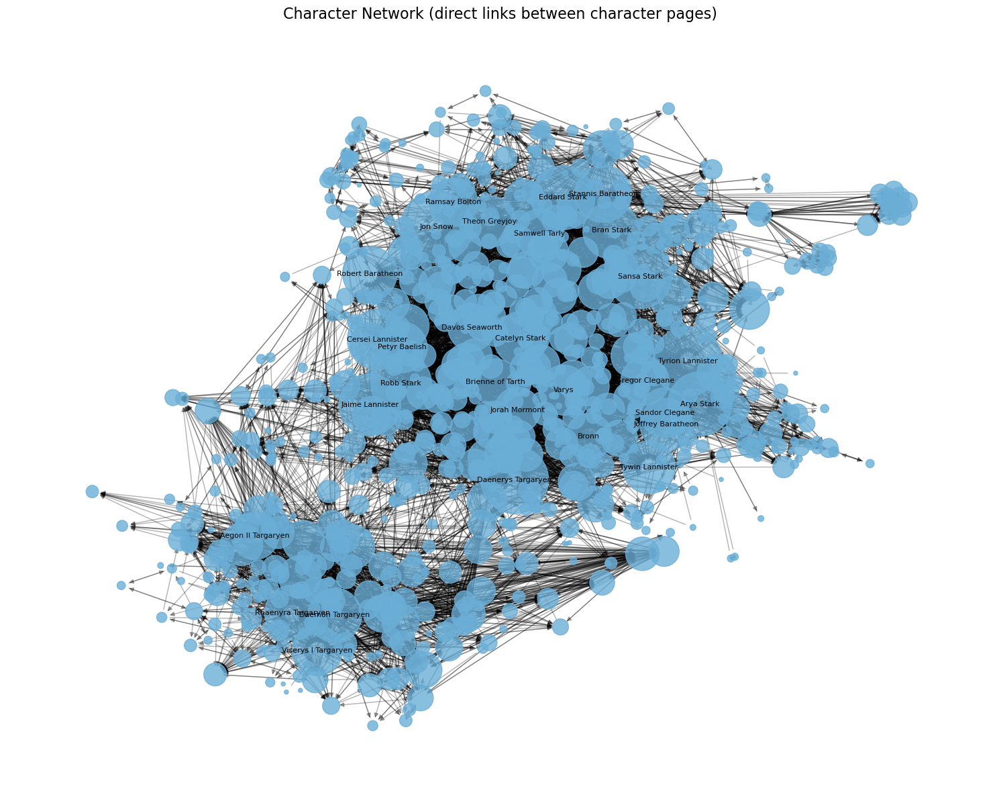

In [15]:
print(f"Visualizing character network: {dg_char_main.number_of_nodes()} nodes, {dg_char_main.number_of_edges()} edges")
# Draw
fig, ax = plt.subplots(figsize=(15, 12))

nx.draw_networkx_edges(dg_char_main, pos_unweighted, alpha=0.3, ax=ax)
nx.draw_networkx_nodes(dg_char_main, pos_unweighted, node_size=node_sizes, 
                       node_color=NODE_COLOR, alpha=0.8, ax=ax)

# Label top nodes only
top_n = 30
top_nodes = sorted(degrees.items(), key=lambda x: x[1], reverse=True)[:top_n]
labels = {node: node for node, _ in top_nodes}
nx.draw_networkx_labels(dg_char_main, pos_unweighted, labels, font_size=8, ax=ax)

ax.set_title(f'Character Network (direct links between character pages)', fontsize=16)
ax.axis('off')
plt.tight_layout()
plt.show()

In [16]:
# Analyze the weighted network
# Show top edges by weight

edge_weights = [(u, v, data['weight']) for u, v, data in dgw_char.edges(data=True)]
edge_weights_sorted = sorted(edge_weights, key=lambda x: x[2], reverse=True)

print("Top 20 character connections by mention count:")
for i, (source, target, weight) in enumerate(edge_weights_sorted[:20], 1):
    print(f"{i}. {source} → {target}: {weight} mentions")

# Show statistics
weights = [w for _, _, w in edge_weights]
print(f"\nWeight statistics:")
print(f"  Mean weight: {sum(weights) / len(weights):.2f}")
print(f"  Max weight: {max(weights)}")
print(f"  Min weight: {min(weights)}")
print(f"  Total mentions tracked: {sum(weights)}")

Top 20 character connections by mention count:
1. Jorah Mormont → Daenerys Targaryen: 285 mentions
2. Daenerys Targaryen → Jon Snow: 240 mentions
3. Tyrion Lannister → Daenerys Targaryen: 199 mentions
4. Jaime Lannister → Cersei Lannister: 198 mentions
5. Tormund → Jon Snow: 190 mentions
6. Alicent Hightower → Rhaenyra Targaryen: 185 mentions
7. Ramsay Bolton → Theon Greyjoy: 177 mentions
8. Sansa Stark → Jon Snow: 169 mentions
9. Theon Greyjoy → Ramsay Bolton: 166 mentions
10. Cersei Lannister → Jaime Lannister: 164 mentions
11. Varys → Tyrion Lannister: 158 mentions
12. Gilly → Samwell Tarly: 156 mentions
13. Tywin Lannister → Tyrion Lannister: 155 mentions
14. Daemon Targaryen → Rhaenyra Targaryen: 154 mentions
15. Bronn → Tyrion Lannister: 153 mentions
16. Cersei Lannister → Tyrion Lannister: 151 mentions
17. Davos Seaworth → Stannis Baratheon: 150 mentions
18. Alliser Thorne → Jon Snow: 149 mentions
19. Petyr Baelish → Sansa Stark: 148 mentions
20. Shae → Tyrion Lannister: 144 men

In [ ]:
# Visualize the weighted character network

# Get largest connected component for visualization

largest_cc_weighted = max(nx.weakly_connected_components(dgw_char), key=len)
DGW_main = dgw_char.subgraph(largest_cc_weighted).copy()

# Calculate layout
pos_weighted = nx.forceatlas2_layout(DGW_main)

Visualizing weighted character network: 818 nodes, 10392 edges


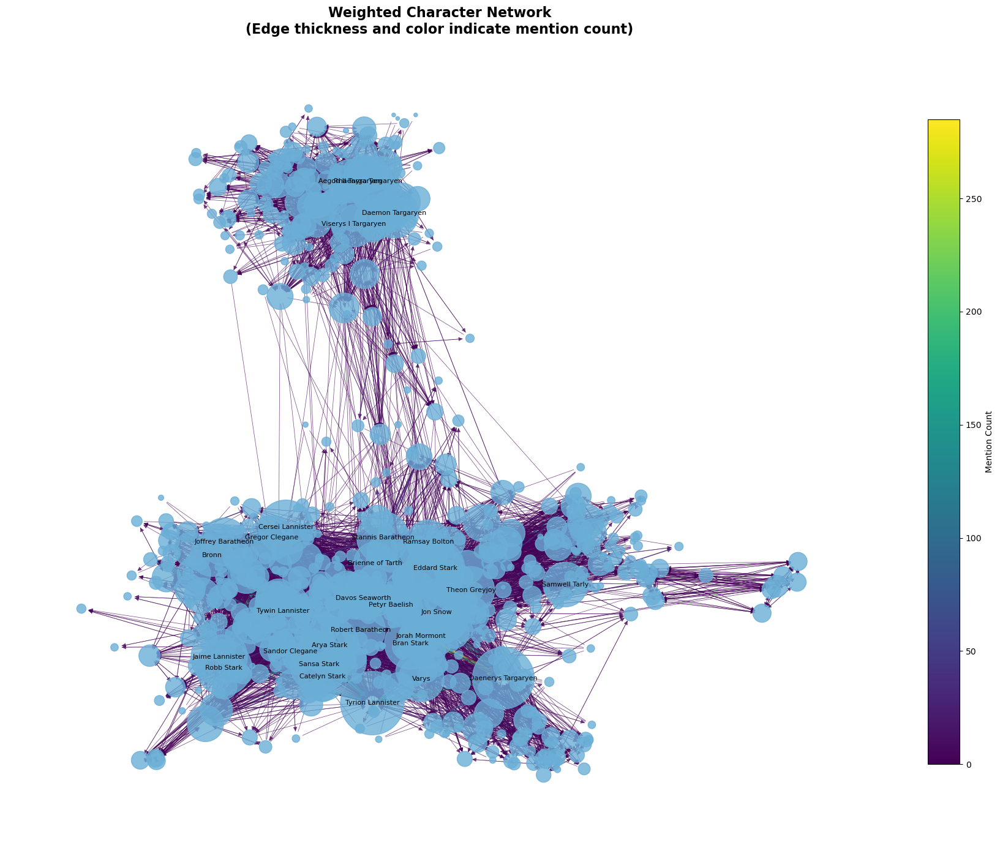


Weight statistics:
  Min weight: 0
  Max weight: 285
  Mean weight: 7.30
  Median weight: 3.00


In [18]:
print(f"Visualizing weighted character network: {DGW_main.number_of_nodes()} nodes, {DGW_main.number_of_edges()} edges")
# Get edge weights for visualization
edges = DGW_main.edges()
weights = [DGW_main[u][v]['weight'] for u, v in edges]

# Normalize weights for visualization (edge width)
max_weight = max(weights)
min_weight = min(weights)
# Scale edge widths between 0.5 and 5
edge_widths = [0.5 + 4.5 * (w - min_weight) / (max_weight - min_weight) if max_weight > min_weight else 2 for w in weights]

# Normalize weights for color mapping
edge_colors = weights

# Node sizes by degree
degrees = dict(DGW_main.degree())
node_sizes = [degrees[n] * 20 for n in DGW_main.nodes()]

# Draw
fig, ax = plt.subplots(figsize=(18, 14))

# Draw edges with varying widths and colors based on weight
edges_collection = nx.draw_networkx_edges(
    DGW_main, pos_weighted, 
    width=edge_widths,
    edge_color=edge_colors,
    edge_cmap=EDGE_CMAP,
    edge_vmin=min_weight,
    edge_vmax=max_weight,
    alpha=0.7,
    arrows=True,
    arrowsize=10,
    ax=ax
)

# Draw nodes
nx.draw_networkx_nodes(DGW_main, pos_weighted, node_size=node_sizes, 
                        node_color=NODE_COLOR, alpha=0.8, ax=ax)

# Label top nodes only
top_n = 30
top_nodes = sorted(degrees.items(), key=lambda x: x[1], reverse=True)[:top_n]
labels = {node: node for node, _ in top_nodes}
nx.draw_networkx_labels(DGW_main, pos_weighted, labels, font_size=8, ax=ax)

# Add colorbar for edge weights
sm = plt.cm.ScalarMappable(cmap=EDGE_CMAP, 
                            norm=plt.Normalize(vmin=min_weight, vmax=max_weight))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, label='Mention Count', shrink=0.8)

ax.set_title('Weighted Character Network\n(Edge thickness and color indicate mention count)', 
                fontsize=16, fontweight='bold')
ax.axis('off')
plt.tight_layout()
plt.show()

print(f"\nWeight statistics:")
print(f"  Min weight: {min_weight}")
print(f"  Max weight: {max_weight}")
print(f"  Mean weight: {np.mean(weights):.2f}")
print(f"  Median weight: {np.median(weights):.2f}")

In [19]:
# Visualize weighted character network with node sizes by weighted in-degree
# Use the same connected component
largest_cc_weighted_indegree = max(nx.weakly_connected_components(dgw_char), key=len)
DGW_main_indegree = dgw_char.subgraph(largest_cc_weighted_indegree).copy()

# Calculate layout (same as previous for consistency)
pos_weighted_indegree = nx.forceatlas2_layout(DGW_main_indegree)

Visualizing weighted character network by in-degree: 818 nodes, 10392 edges


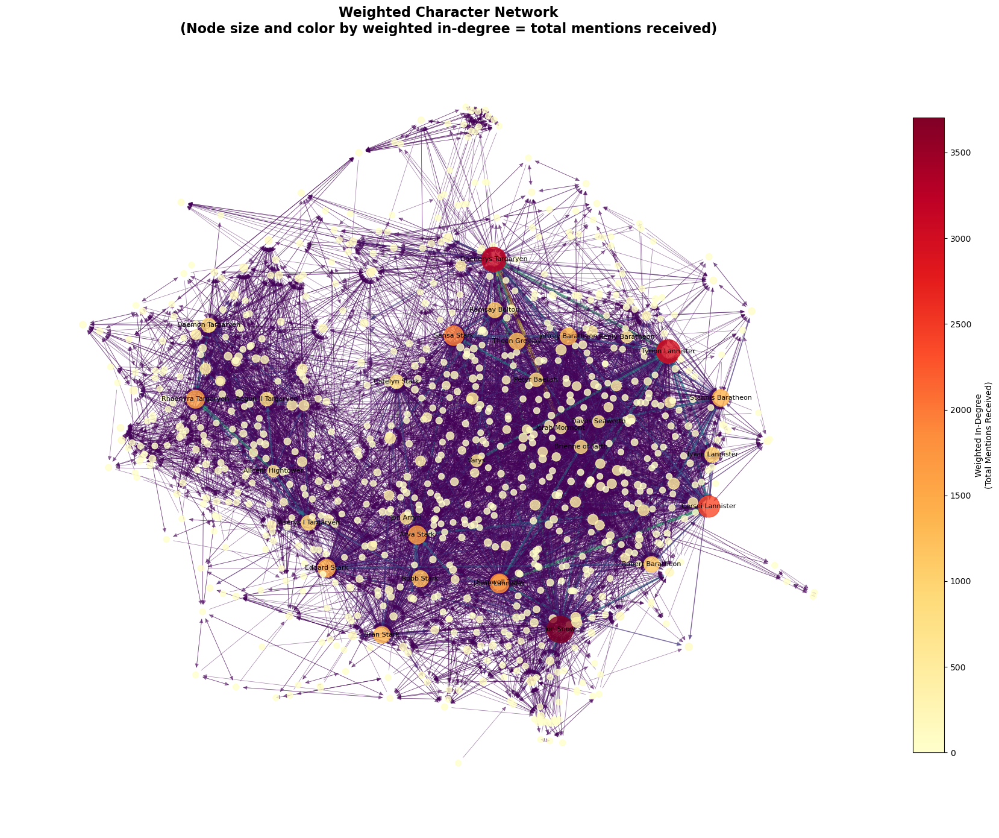

In [20]:
print(f"Visualizing weighted character network by in-degree: {DGW_main_indegree.number_of_nodes()} nodes, {DGW_main_indegree.number_of_edges()} edges")

# Calculate weighted in-degree (sum of weights of incoming edges)
weighted_in_degree = {}
for node in DGW_main_indegree.nodes():
    in_edges = DGW_main_indegree.in_edges(node, data=True)
    total_weight = sum(data['weight'] for _, _, data in in_edges)
    weighted_in_degree[node] = total_weight

# Get edge weights for visualization
edges = DGW_main_indegree.edges()
weights = [DGW_main_indegree[u][v]['weight'] for u, v in edges]

# Normalize weights for visualization (edge width)
max_weight = max(weights)
min_weight = min(weights)
edge_widths = [0.5 + 4.5 * (w - min_weight) / (max_weight - min_weight) if max_weight > min_weight else 2 for w in weights]
edge_colors = weights

# Node sizes by weighted in-degree
max_in_degree = max(weighted_in_degree.values()) if weighted_in_degree else 1
min_in_degree = min(weighted_in_degree.values()) if weighted_in_degree else 0
node_sizes = [50 + 950 * (weighted_in_degree[n] - min_in_degree) / (max_in_degree - min_in_degree) 
              if max_in_degree > min_in_degree else 500 
              for n in DGW_main_indegree.nodes()]

# Node colors by weighted in-degree
node_colors = [weighted_in_degree[n] for n in DGW_main_indegree.nodes()]

# Draw
fig, ax = plt.subplots(figsize=(18, 14))

# Draw edges
nx.draw_networkx_edges(
    DGW_main_indegree, pos_weighted_indegree, 
    width=edge_widths,
    edge_color=edge_colors,
    edge_cmap=EDGE_CMAP,
    edge_vmin=min_weight,
    edge_vmax=max_weight,
    alpha=0.5,
    arrows=True,
    arrowsize=10,
    ax=ax
)

# Draw nodes with color and size based on weighted in-degree
nodes_collection = nx.draw_networkx_nodes(
    DGW_main_indegree, pos_weighted_indegree, 
    node_size=node_sizes,
    node_color=node_colors,
    cmap=NODE_CMAP,
    vmin=min_in_degree,
    vmax=max_in_degree,
    alpha=0.8,
    ax=ax
)

# Label top nodes by weighted in-degree
top_n = 30
top_nodes_by_in_degree = sorted(weighted_in_degree.items(), key=lambda x: x[1], reverse=True)[:top_n]
labels = {node: node for node, _ in top_nodes_by_in_degree}
nx.draw_networkx_labels(DGW_main_indegree, pos_weighted_indegree, labels, font_size=8, ax=ax)

# Add colorbar for node colors (weighted in-degree)
sm_nodes = plt.cm.ScalarMappable(cmap=NODE_CMAP, 
                                 norm=plt.Normalize(vmin=min_in_degree, vmax=max_in_degree))
sm_nodes.set_array([])
cbar_nodes = plt.colorbar(sm_nodes, ax=ax, label='Weighted In-Degree\n(Total Mentions Received)', 
                          shrink=0.8, pad=0.02)

ax.set_title('Weighted Character Network\n(Node size and color by weighted in-degree = total mentions received)', 
             fontsize=16, fontweight='bold')
ax.axis('off')
plt.tight_layout()
plt.show()


In [21]:
print(f"\nWeighted In-Degree statistics:")
print(f"  Min: {min_in_degree}")
print(f"  Max: {max_in_degree}")
print(f"  Mean: {np.mean(list(weighted_in_degree.values())):.2f}")
print(f"  Median: {np.median(list(weighted_in_degree.values())):.2f}")

print(f"\nTop 10 characters by weighted in-degree (most mentioned):")
for i, (char, weight) in enumerate(top_nodes_by_in_degree[:20], 1):
    print(f"  {i}. {char}: {weight} total mentions received")





Weighted In-Degree statistics:
  Min: 0
  Max: 3705
  Mean: 92.79
  Median: 11.50

Top 10 characters by weighted in-degree (most mentioned):
  1. Jon Snow: 3705 total mentions received
  2. Daenerys Targaryen: 3121 total mentions received
  3. Tyrion Lannister: 2919 total mentions received
  4. Cersei Lannister: 2354 total mentions received
  5. Sansa Stark: 1926 total mentions received
  6. Jaime Lannister: 1812 total mentions received
  7. Arya Stark: 1621 total mentions received
  8. Rhaenyra Targaryen: 1606 total mentions received
  9. Eddard Stark: 1488 total mentions received
  10. Stannis Baratheon: 1383 total mentions received
  11. Bran Stark: 1349 total mentions received
  12. Joffrey Baratheon: 1337 total mentions received
  13. Robb Stark: 1284 total mentions received
  14. Theon Greyjoy: 1269 total mentions received
  15. Robert Baratheon: 1154 total mentions received
  16. Ramsay Bolton: 1096 total mentions received
  17. Tywin Lannister: 1051 total mentions received
  1

## Looking at communities

In [23]:
dg_undir = dg_char.to_undirected()
dgw_undir = dgw_char.to_undirected()

In [24]:
dg_communities = nx.community.louvain_communities(dg_undir, weight='weight', seed=42)
dgw_communities = nx.community.louvain_communities(dgw_undir, weight='weight', seed=42)

In [25]:
# Analyze community structure
print(f"=== Community Analysis ===\n")

print(f"Unweighted graph communities: {len(dg_communities)}")
print(f"Weighted graph communities: {len(dgw_communities)}")

# Calculate modularity (quality metric: -0.5 to 1, higher is better)
dg_modularity = nx.community.modularity(dg_undir, dg_communities)
dgw_modularity = nx.community.modularity(dgw_undir, dgw_communities, weight='weight')

print(f"\nModularity scores:")
print(f"  Unweighted: {dg_modularity:.4f}")
print(f"  Weighted: {dgw_modularity:.4f}")

# Analyze community sizes
print(f"\n=== Community Sizes (Weighted) ===")
sorted_communities = sorted(dgw_communities, key=len, reverse=True)
for i, comm in enumerate(sorted_communities[:10], 1):
    print(f"Community {i}: {len(comm)} members")

# Show members of largest communities
print(f"\n=== Largest Community Members ===")
for i, comm in enumerate(sorted_communities[:3], 1):
    members = sorted(list(comm))[:20]  # Show first 20
    print(f"\nCommunity {i} (showing up to 20/{len(comm)} members):")
    print(f"  {', '.join(members)}")

# Find which community major characters belong to
major_chars = ['Jon Snow', 'Daenerys Targaryen', 'Tyrion Lannister', 
               'Arya Stark', 'Cersei Lannister', 'Sansa Stark']

print(f"\n=== Major Characters by Community ===")
for char in major_chars:
    for i, comm in enumerate(dgw_communities, 1):
        if char in comm:
            print(f"{char}: Community {i} (size: {len(comm)})")
            break

=== Community Analysis ===

Unweighted graph communities: 22
Weighted graph communities: 34

Modularity scores:
  Unweighted: 0.5294
  Weighted: 0.5527

=== Community Sizes (Weighted) ===
Community 1: 171 members
Community 2: 165 members
Community 3: 142 members
Community 4: 127 members
Community 5: 122 members
Community 6: 91 members
Community 7: 2 members
Community 8: 1 members
Community 9: 1 members
Community 10: 1 members

=== Largest Community Members ===

Community 1 (showing up to 20/171 members):
  Addam, Addam of Hull, Adrian Redfort, Aegon II Targaryen, Aegon Targaryen (son of Rhaenyra), Aemma Arryn, Aemond Targaryen, Aeron Bracken, Alfred Broome, Alicent Hightower, Allun Caswell, Alyn of Hull, Alys Rivers, Alyssa Targaryen, Alyssa Velaryon, Amos Bracken, Arrax, Arryk Cargyll, Axell Bulwer, Baela Targaryen

Community 2 (showing up to 20/165 members):
  Alanna, Alys Arryn, Amory Lorch, Anara, Andar Royce, Anguy, Anya Waynwood, Arthur Dayne, Arya Stark, Aya, Beric Dondarrion, B

Visualizing communities in unweighted network...


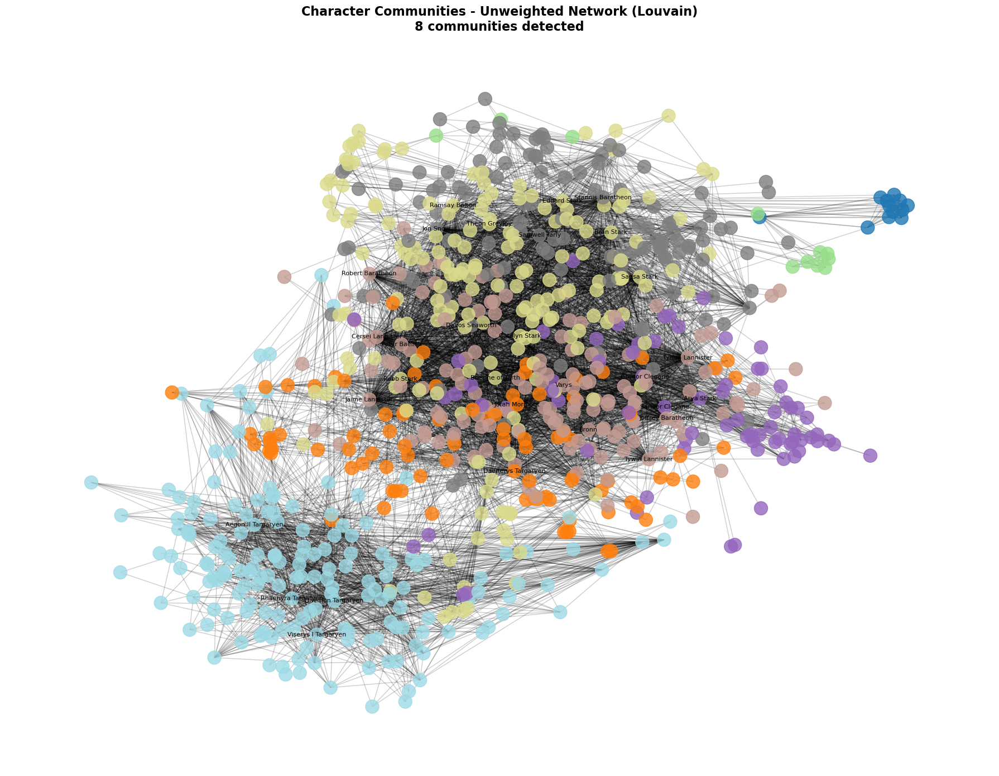


Communities in unweighted visualization: 8


In [32]:
# Visualize communities - UNWEIGHTED network
print(f"Visualizing communities in unweighted network...")

# Use the main connected component for visualization
G_vis_unw = dg_undir.subgraph(dg_char_main.nodes()).copy()

# Find communities in this subgraph
comm_vis_unw = [comm & set(G_vis_unw.nodes()) for comm in dg_communities if comm & set(G_vis_unw.nodes())]
comm_vis_unw = [c for c in comm_vis_unw if len(c) > 0]

# Assign colors to nodes based on community
node_to_comm_vis_unw = {}
for i, comm in enumerate(comm_vis_unw):
    for node in comm:
        node_to_comm_vis_unw[node] = i

# Create color palette for communities
num_communities_unw = len(comm_vis_unw)
colors_unw = plt.cm.tab20(np.linspace(0, 1, num_communities_unw))

node_colors_comm_unw = [colors_unw[node_to_comm_vis_unw.get(n, 0)] for n in G_vis_unw.nodes()]

# Draw
fig, ax = plt.subplots(figsize=(18, 14))

nx.draw_networkx_edges(G_vis_unw, pos_unweighted, alpha=0.2, ax=ax)
nx.draw_networkx_nodes(G_vis_unw, pos_unweighted, 
                       node_color=node_colors_comm_unw, 
                       node_size=300, 
                       alpha=0.8, ax=ax)

# Label top nodes
degrees_vis_unw = dict(G_vis_unw.degree())
top_nodes_vis_unw = sorted(degrees_vis_unw.items(), key=lambda x: x[1], reverse=True)[:30]
labels_vis_unw = {node: node for node, _ in top_nodes_vis_unw}
nx.draw_networkx_labels(G_vis_unw, pos_unweighted, labels_vis_unw, font_size=8, ax=ax)

ax.set_title(f'Character Communities - Unweighted Network (Louvain)\n{len(comm_vis_unw)} communities detected', 
             fontsize=16, fontweight='bold')
ax.axis('off')
plt.tight_layout()
plt.show()

print(f"\nCommunities in unweighted visualization: {len(comm_vis_unw)}")

Visualizing communities in weighted network...


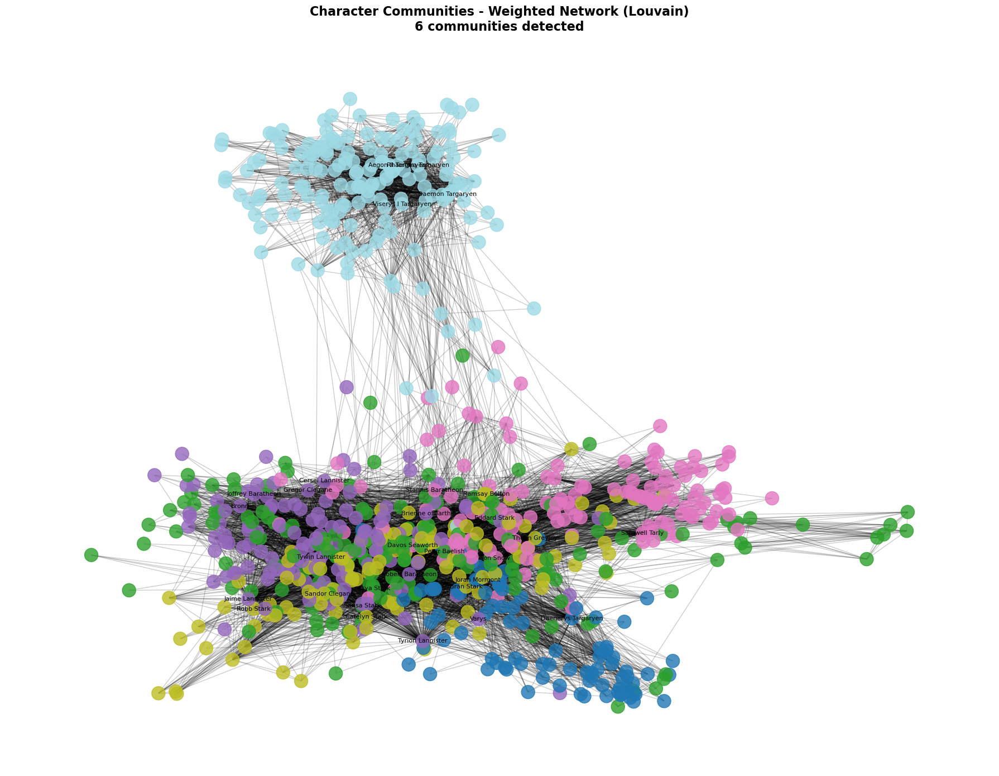


Communities in weighted visualization: 6


In [33]:
# Visualize communities - WEIGHTED network
print(f"Visualizing communities in weighted network...")

# Use the main connected component for visualization
G_vis = dgw_undir.subgraph(DGW_main.nodes()).copy()

# Find communities in this subgraph
comm_vis = [comm & set(G_vis.nodes()) for comm in dgw_communities if comm & set(G_vis.nodes())]
comm_vis = [c for c in comm_vis if len(c) > 0]

# Assign colors to nodes based on community
node_to_comm_vis = {}
for i, comm in enumerate(comm_vis):
    for node in comm:
        node_to_comm_vis[node] = i

# Create color palette for communities
num_communities = len(comm_vis)
colors = plt.cm.tab20(np.linspace(0, 1, num_communities))

node_colors_comm = [colors[node_to_comm_vis.get(n, 0)] for n in G_vis.nodes()]

# Draw
fig, ax = plt.subplots(figsize=(18, 14))

nx.draw_networkx_edges(G_vis, pos_weighted, alpha=0.2, ax=ax)
nx.draw_networkx_nodes(G_vis, pos_weighted, 
                       node_color=node_colors_comm, 
                       node_size=300, 
                       alpha=0.8, ax=ax)

# Label top nodes
degrees_vis = dict(G_vis.degree())
top_nodes_vis = sorted(degrees_vis.items(), key=lambda x: x[1], reverse=True)[:30]
labels_vis = {node: node for node, _ in top_nodes_vis}
nx.draw_networkx_labels(G_vis, pos_weighted, labels_vis, font_size=8, ax=ax)

ax.set_title(f'Character Communities - Weighted Network (Louvain)\n{len(comm_vis)} communities detected', 
             fontsize=16, fontweight='bold')
ax.axis('off')
plt.tight_layout()
plt.show()

print(f"\nCommunities in weighted visualization: {len(comm_vis)}")

Creating subplots for largest communities (weighted)...


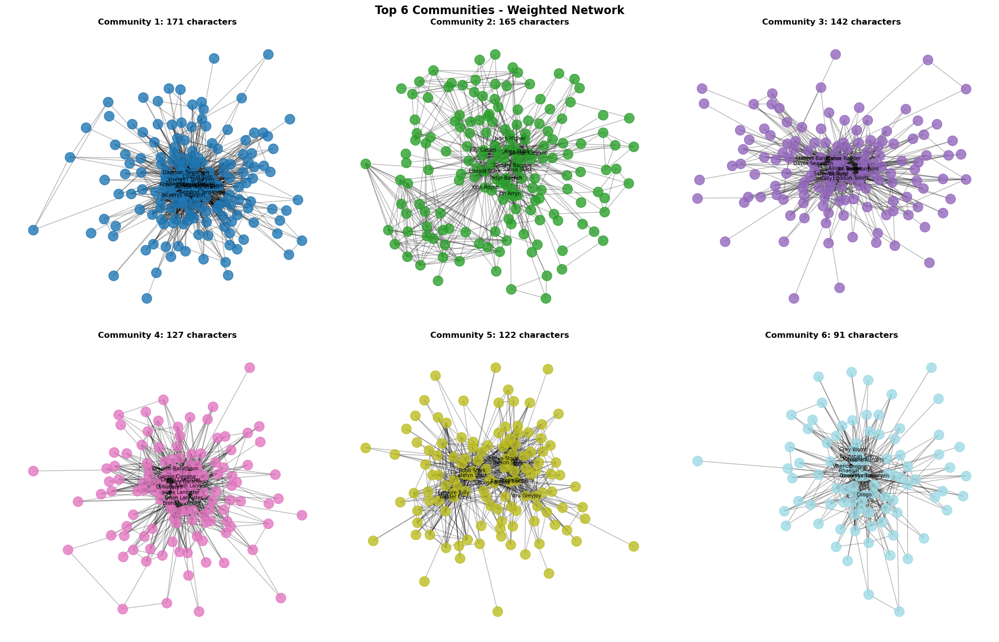

In [34]:
# Visualize individual communities as subplots - WEIGHTED network
print(f"Creating subplots for largest communities (weighted)...")

# Sort communities by size
sorted_comms = sorted(comm_vis, key=len, reverse=True)

# Show top 6 largest communities
num_to_show = min(6, len(sorted_comms))
fig, axes = plt.subplots(2, 3, figsize=(20, 13))
axes = axes.flatten()

for idx in range(num_to_show):
    comm = sorted_comms[idx]
    ax = axes[idx]
    
    # Create subgraph for this community
    comm_graph = G_vis.subgraph(comm).copy()
    
    # Calculate layout for this community
    comm_pos = nx.spring_layout(comm_graph, k=0.5, iterations=50, seed=42)
    
    # Draw
    nx.draw_networkx_edges(comm_graph, comm_pos, alpha=0.3, ax=ax)
    nx.draw_networkx_nodes(comm_graph, comm_pos, 
                           node_color=colors[idx], 
                           node_size=200, 
                           alpha=0.8, ax=ax)
    
    # Label all nodes if small enough, otherwise top nodes
    if len(comm) <= 15:
        nx.draw_networkx_labels(comm_graph, comm_pos, font_size=7, ax=ax)
    else:
        # Show top 10 by degree
        comm_degrees = dict(comm_graph.degree())
        top_in_comm = sorted(comm_degrees.items(), key=lambda x: x[1], reverse=True)[:10]
        labels_comm = {node: node for node, _ in top_in_comm}
        nx.draw_networkx_labels(comm_graph, comm_pos, labels_comm, font_size=7, ax=ax)
    
    ax.set_title(f'Community {idx+1}: {len(comm)} characters', fontsize=12, fontweight='bold')
    ax.axis('off')

# Hide empty subplots if we have fewer than 6 communities
for idx in range(num_to_show, 6):
    axes[idx].axis('off')

plt.suptitle('Top 6 Communities - Weighted Network', fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

Creating subplots for largest communities (unweighted)...


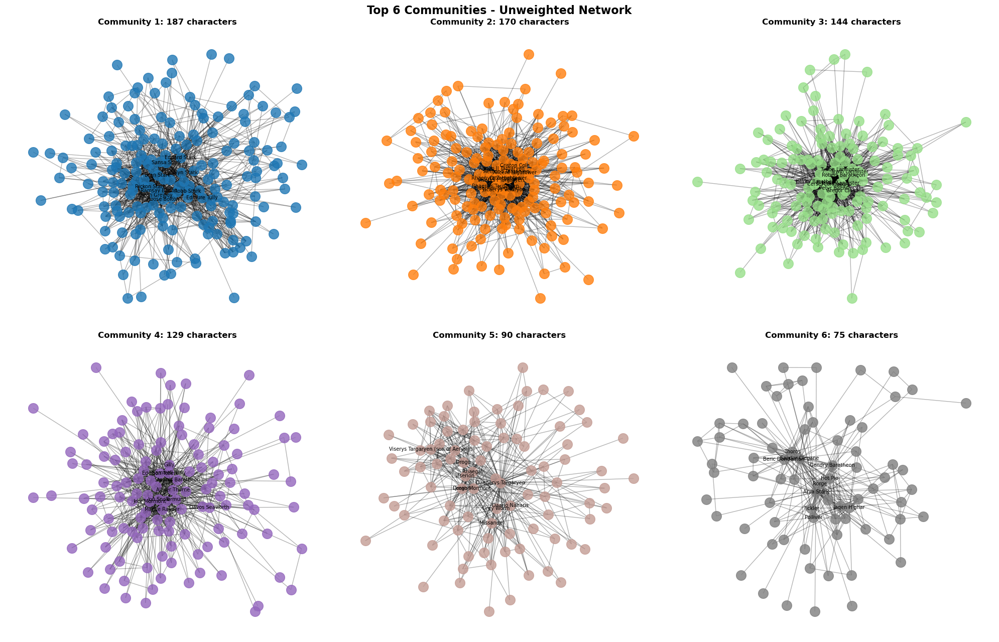

In [35]:
# Visualize individual communities as subplots - UNWEIGHTED network
print(f"Creating subplots for largest communities (unweighted)...")

# Sort communities by size
sorted_comms_unw = sorted(comm_vis_unw, key=len, reverse=True)

# Show top 6 largest communities
num_to_show_unw = min(6, len(sorted_comms_unw))
fig, axes = plt.subplots(2, 3, figsize=(20, 13))
axes = axes.flatten()

for idx in range(num_to_show_unw):
    comm = sorted_comms_unw[idx]
    ax = axes[idx]
    
    # Create subgraph for this community
    comm_graph = G_vis_unw.subgraph(comm).copy()
    
    # Calculate layout for this community
    comm_pos = nx.spring_layout(comm_graph, k=0.5, iterations=50, seed=42)
    
    # Draw
    nx.draw_networkx_edges(comm_graph, comm_pos, alpha=0.3, ax=ax)
    nx.draw_networkx_nodes(comm_graph, comm_pos, 
                           node_color=colors_unw[idx], 
                           node_size=200, 
                           alpha=0.8, ax=ax)
    
    # Label all nodes if small enough, otherwise top nodes
    if len(comm) <= 15:
        nx.draw_networkx_labels(comm_graph, comm_pos, font_size=7, ax=ax)
    else:
        # Show top 10 by degree
        comm_degrees = dict(comm_graph.degree())
        top_in_comm = sorted(comm_degrees.items(), key=lambda x: x[1], reverse=True)[:10]
        labels_comm = {node: node for node, _ in top_in_comm}
        nx.draw_networkx_labels(comm_graph, comm_pos, labels_comm, font_size=7, ax=ax)
    
    ax.set_title(f'Community {idx+1}: {len(comm)} characters', fontsize=12, fontweight='bold')
    ax.axis('off')

# Hide empty subplots if we have fewer than 6 communities
for idx in range(num_to_show_unw, 6):
    axes[idx].axis('off')

plt.suptitle('Top 6 Communities - Unweighted Network', fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

In [36]:
# Calculate inter-community vs intra-community edges
print(f"\n=== Edge Distribution ===")

# Count edges within communities vs between communities
intra_edges = 0
inter_edges = 0

# Create node-to-community mapping
node_to_comm = {}
for i, comm in enumerate(dgw_communities):
    for node in comm:
        node_to_comm[node] = i

for u, v in dgw_undir.edges():
    if node_to_comm.get(u) == node_to_comm.get(v):
        intra_edges += 1
    else:
        inter_edges += 1

total_edges = intra_edges + inter_edges
print(f"Edges within communities: {intra_edges} ({100*intra_edges/total_edges:.1f}%)")
print(f"Edges between communities: {inter_edges} ({100*inter_edges/total_edges:.1f}%)")


=== Edge Distribution ===
Edges within communities: 4888 (66.7%)
Edges between communities: 2437 (33.3%)


In [37]:
# Find overlapping communities using k-clique percolation
# k=4 means communities are formed by overlapping cliques of size 4

print("Finding overlapping communities with k-clique percolation...")
print("This may take a moment...\n")

# Try different k values for unweighted graph
k_values = [3, 4, 5]

dg_kclique_results = {}
for k in k_values:
    try:
        communities = list(nx.community.k_clique_communities(dg_undir, k))
        dg_kclique_results[k] = communities
        print(f"k={k}: Found {len(communities)} overlapping communities")
    except Exception as e:
        print(f"k={k}: Could not compute (graph may not have enough cliques of this size)")

# Try for weighted graph
dgw_kclique_results = {}
for k in k_values:
    try:
        communities = list(nx.community.k_clique_communities(dgw_undir, k))
        dgw_kclique_results[k] = communities
        print(f"Weighted k={k}: Found {len(communities)} overlapping communities")
    except Exception as e:
        print(f"Weighted k={k}: Could not compute (graph may not have enough cliques of this size)")

Finding overlapping communities with k-clique percolation...
This may take a moment...

k=3: Found 4 overlapping communities
k=3: Found 4 overlapping communities
k=4: Found 16 overlapping communities
k=4: Found 16 overlapping communities
k=5: Found 18 overlapping communities
k=5: Found 18 overlapping communities
Weighted k=3: Found 4 overlapping communities
Weighted k=3: Found 4 overlapping communities
Weighted k=4: Found 16 overlapping communities
Weighted k=4: Found 16 overlapping communities
Weighted k=5: Found 18 overlapping communities
Weighted k=5: Found 18 overlapping communities


In [38]:
# Compare Louvain vs k-clique communities for both weighted and unweighted
print("=== Comparison: Louvain vs k-clique ===\n")

# Weighted graph comparison
print("--- WEIGHTED GRAPH ---")
print(f"\nLouvain (non-overlapping):")
print(f"  Communities: {len(dgw_communities)}")
print(f"  Modularity: {dgw_modularity:.4f}")
print(f"  All nodes assigned: Yes")

k_to_compare_w = None
for k in [4, 3]:
    if k in dgw_kclique_results and len(dgw_kclique_results[k]) > 0:
        k_to_compare_w = k
        break

if k_to_compare_w:
    kclique_communities = dgw_kclique_results[k_to_compare_w]
    
    print(f"\nk-clique (overlapping, k={k_to_compare_w}):")
    print(f"  Communities: {len(kclique_communities)}")
    
    # Count total unique nodes
    all_kclique_nodes = set()
    for comm in kclique_communities:
        all_kclique_nodes.update(comm)
    
    print(f"  Nodes in communities: {len(all_kclique_nodes)}/{dgw_undir.number_of_nodes()}")
    
    # Count overlapping memberships
    node_count = {}
    for comm in kclique_communities:
        for node in comm:
            node_count[node] = node_count.get(node, 0) + 1
    
    multi_members = sum(1 for count in node_count.values() if count > 1)
    print(f"  Nodes in multiple communities: {multi_members}")
    
    avg_memberships = sum(node_count.values()) / len(node_count) if node_count else 0
    print(f"  Average memberships per node: {avg_memberships:.2f}")

# Unweighted graph comparison
print("\n\n--- UNWEIGHTED GRAPH ---")
print(f"\nLouvain (non-overlapping):")
print(f"  Communities: {len(dg_communities)}")
print(f"  Modularity: {dg_modularity:.4f}")
print(f"  All nodes assigned: Yes")

k_to_compare_unw = None
for k in [4, 3]:
    if k in dg_kclique_results and len(dg_kclique_results[k]) > 0:
        k_to_compare_unw = k
        break

if k_to_compare_unw:
    kclique_communities_unw = dg_kclique_results[k_to_compare_unw]
    
    print(f"\nk-clique (overlapping, k={k_to_compare_unw}):")
    print(f"  Communities: {len(kclique_communities_unw)}")
    
    # Count total unique nodes
    all_kclique_nodes_unw = set()
    for comm in kclique_communities_unw:
        all_kclique_nodes_unw.update(comm)
    
    print(f"  Nodes in communities: {len(all_kclique_nodes_unw)}/{dg_undir.number_of_nodes()}")
    
    # Count overlapping memberships
    node_count_unw = {}
    for comm in kclique_communities_unw:
        for node in comm:
            node_count_unw[node] = node_count_unw.get(node, 0) + 1
    
    multi_members_unw = sum(1 for count in node_count_unw.values() if count > 1)
    print(f"  Nodes in multiple communities: {multi_members_unw}")
    
    avg_memberships_unw = sum(node_count_unw.values()) / len(node_count_unw) if node_count_unw else 0
    print(f"  Average memberships per node: {avg_memberships_unw:.2f}")

print("\n\nKey difference: k-clique allows nodes to belong to multiple communities,")
print("better representing characters with complex relationships across different groups.")

=== Comparison: Louvain vs k-clique ===

--- WEIGHTED GRAPH ---

Louvain (non-overlapping):
  Communities: 34
  Modularity: 0.5527
  All nodes assigned: Yes

k-clique (overlapping, k=4):
  Communities: 16
  Nodes in communities: 737/847
  Nodes in multiple communities: 25
  Average memberships per node: 1.04


--- UNWEIGHTED GRAPH ---

Louvain (non-overlapping):
  Communities: 22
  Modularity: 0.5294
  All nodes assigned: Yes

k-clique (overlapping, k=4):
  Communities: 16
  Nodes in communities: 737/847
  Nodes in multiple communities: 25
  Average memberships per node: 1.04


Key difference: k-clique allows nodes to belong to multiple communities,
better representing characters with complex relationships across different groups.


Visualizing overlapping communities (k=4, unweighted)...


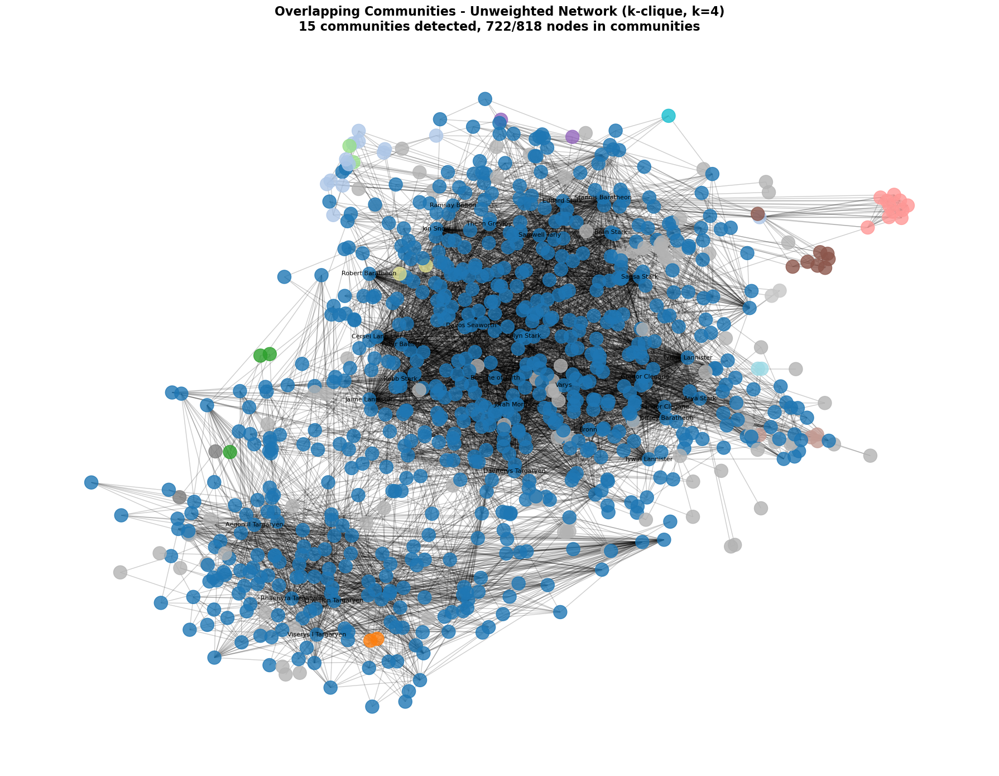


Communities in visualization: 15
Nodes in at least one community: 722
Nodes not in any k-clique community (shown in grey): 96


In [39]:
# Visualize overlapping communities - UNWEIGHTED GRAPH
# Choose k value that produced results (try k=3 or k=4)
k_to_viz_unw = None
for k in [4, 3]:  # Prefer k=4, fall back to k=3
    if k in dg_kclique_results and len(dg_kclique_results[k]) > 0:
        k_to_viz_unw = k
        break

if k_to_viz_unw:
    communities = dg_kclique_results[k_to_viz_unw]
    
    print(f"Visualizing overlapping communities (k={k_to_viz_unw}, unweighted)...")
    
    # Use the main connected component for visualization
    G_vis_kclique_unw = dg_undir.subgraph(dg_char_main.nodes()).copy()
    
    # Filter communities to only include nodes in visualization
    comm_vis_kclique_unw = [comm & set(G_vis_kclique_unw.nodes()) for comm in communities if comm & set(G_vis_kclique_unw.nodes())]
    comm_vis_kclique_unw = [c for c in comm_vis_kclique_unw if len(c) > 0]
    
    # For nodes in multiple communities, assign to the largest one for visualization
    node_to_comm_kclique_unw = {}
    for i, comm in enumerate(comm_vis_kclique_unw):
        for node in comm:
            if node not in node_to_comm_kclique_unw:
                node_to_comm_kclique_unw[node] = i
            else:
                # If already assigned, keep assignment to larger community
                prev_comm_size = len(comm_vis_kclique_unw[node_to_comm_kclique_unw[node]])
                curr_comm_size = len(comm)
                if curr_comm_size > prev_comm_size:
                    node_to_comm_kclique_unw[node] = i
    
    # Create color palette
    num_communities_kclique_unw = len(comm_vis_kclique_unw)
    colors_kclique_unw = plt.cm.tab20(np.linspace(0, 1, num_communities_kclique_unw))
    
    # Assign colors (grey for nodes not in any k-clique community)
    node_colors_kclique_unw = []
    for n in G_vis_kclique_unw.nodes():
        if n in node_to_comm_kclique_unw:
            node_colors_kclique_unw.append(colors_kclique_unw[node_to_comm_kclique_unw[n]])
        else:
            node_colors_kclique_unw.append([0.7, 0.7, 0.7, 0.5])  # Grey
    
    # Draw
    fig, ax = plt.subplots(figsize=(18, 14))
    
    nx.draw_networkx_edges(G_vis_kclique_unw, pos_unweighted, alpha=0.2, ax=ax)
    nx.draw_networkx_nodes(G_vis_kclique_unw, pos_unweighted, 
                           node_color=node_colors_kclique_unw, 
                           node_size=300, 
                           alpha=0.8, ax=ax)
    
    # Label top nodes
    degrees_vis_kclique_unw = dict(G_vis_kclique_unw.degree())
    top_nodes_kclique_unw = sorted(degrees_vis_kclique_unw.items(), key=lambda x: x[1], reverse=True)[:30]
    labels_kclique_unw = {node: node for node, _ in top_nodes_kclique_unw}
    nx.draw_networkx_labels(G_vis_kclique_unw, pos_unweighted, labels_kclique_unw, font_size=8, ax=ax)
    
    nodes_in_kclique_unw = len(node_to_comm_kclique_unw)
    total_nodes_unw = G_vis_kclique_unw.number_of_nodes()
    
    ax.set_title(f'Overlapping Communities - Unweighted Network (k-clique, k={k_to_viz_unw})\n{len(comm_vis_kclique_unw)} communities detected, {nodes_in_kclique_unw}/{total_nodes_unw} nodes in communities', 
                 fontsize=16, fontweight='bold')
    ax.axis('off')
    plt.tight_layout()
    plt.show()
    
    print(f"\nCommunities in visualization: {len(comm_vis_kclique_unw)}")
    print(f"Nodes in at least one community: {nodes_in_kclique_unw}")
    print(f"Nodes not in any k-clique community (shown in grey): {total_nodes_unw - nodes_in_kclique_unw}")
else:
    print("\nNo k-clique communities found to visualize for unweighted graph.")

Visualizing overlapping communities (k=4, weighted)...


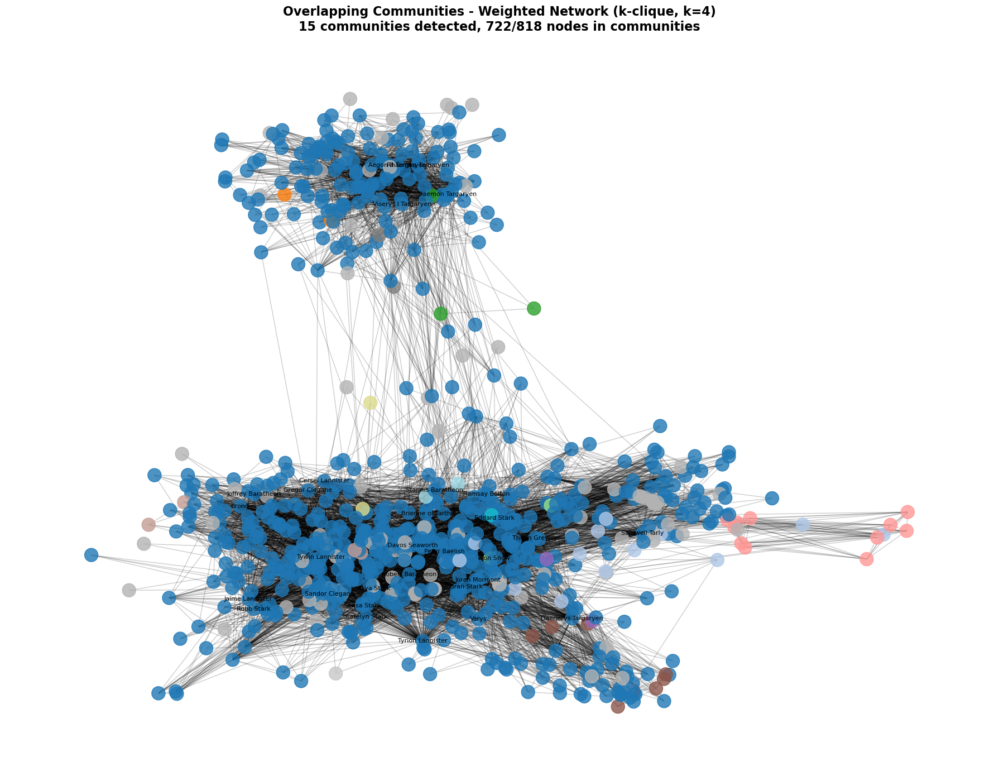


Communities in visualization: 15
Nodes in at least one community: 722
Nodes not in any k-clique community (shown in grey): 96


In [40]:
# Visualize overlapping communities - WEIGHTED GRAPH
# Choose k value that produced results (try k=3 or k=4)
k_to_viz = None
for k in [4, 3]:  # Prefer k=4, fall back to k=3
    if k in dgw_kclique_results and len(dgw_kclique_results[k]) > 0:
        k_to_viz = k
        break

if k_to_viz:
    communities = dgw_kclique_results[k_to_viz]
    
    print(f"Visualizing overlapping communities (k={k_to_viz}, weighted)...")
    
    # Use the main connected component for visualization
    G_vis_kclique_w = dgw_undir.subgraph(DGW_main.nodes()).copy()
    
    # Filter communities to only include nodes in visualization
    comm_vis_kclique_w = [comm & set(G_vis_kclique_w.nodes()) for comm in communities if comm & set(G_vis_kclique_w.nodes())]
    comm_vis_kclique_w = [c for c in comm_vis_kclique_w if len(c) > 0]
    
    # For nodes in multiple communities, assign to the largest one for visualization
    node_to_comm_kclique_w = {}
    for i, comm in enumerate(comm_vis_kclique_w):
        for node in comm:
            if node not in node_to_comm_kclique_w:
                node_to_comm_kclique_w[node] = i
            else:
                # If already assigned, keep assignment to larger community
                prev_comm_size = len(comm_vis_kclique_w[node_to_comm_kclique_w[node]])
                curr_comm_size = len(comm)
                if curr_comm_size > prev_comm_size:
                    node_to_comm_kclique_w[node] = i
    
    # Create color palette
    num_communities_kclique_w = len(comm_vis_kclique_w)
    colors_kclique_w = plt.cm.tab20(np.linspace(0, 1, num_communities_kclique_w))
    
    # Assign colors (grey for nodes not in any k-clique community)
    node_colors_kclique_w = []
    for n in G_vis_kclique_w.nodes():
        if n in node_to_comm_kclique_w:
            node_colors_kclique_w.append(colors_kclique_w[node_to_comm_kclique_w[n]])
        else:
            node_colors_kclique_w.append([0.7, 0.7, 0.7, 0.5])  # Grey
    
    # Draw
    fig, ax = plt.subplots(figsize=(18, 14))
    
    nx.draw_networkx_edges(G_vis_kclique_w, pos_weighted, alpha=0.2, ax=ax)
    nx.draw_networkx_nodes(G_vis_kclique_w, pos_weighted, 
                           node_color=node_colors_kclique_w, 
                           node_size=300, 
                           alpha=0.8, ax=ax)
    
    # Label top nodes
    degrees_vis_kclique_w = dict(G_vis_kclique_w.degree())
    top_nodes_kclique_w = sorted(degrees_vis_kclique_w.items(), key=lambda x: x[1], reverse=True)[:30]
    labels_kclique_w = {node: node for node, _ in top_nodes_kclique_w}
    nx.draw_networkx_labels(G_vis_kclique_w, pos_weighted, labels_kclique_w, font_size=8, ax=ax)
    
    nodes_in_kclique_w = len(node_to_comm_kclique_w)
    total_nodes_w = G_vis_kclique_w.number_of_nodes()
    
    ax.set_title(f'Overlapping Communities - Weighted Network (k-clique, k={k_to_viz})\n{len(comm_vis_kclique_w)} communities detected, {nodes_in_kclique_w}/{total_nodes_w} nodes in communities', 
                 fontsize=16, fontweight='bold')
    ax.axis('off')
    plt.tight_layout()
    plt.show()
    
    print(f"\nCommunities in visualization: {len(comm_vis_kclique_w)}")
    print(f"Nodes in at least one community: {nodes_in_kclique_w}")
    print(f"Nodes not in any k-clique community (shown in grey): {total_nodes_w - nodes_in_kclique_w}")
else:
    print("\nNo k-clique communities found to visualize for weighted graph.")

In [41]:
# Analyze overlapping communities for both weighted and unweighted graphs
print("=== Overlapping Community Analysis ===\n")

# Analyze unweighted k-clique communities
for k in [3, 4, 5]:
    if k in dg_kclique_results and len(dg_kclique_results[k]) > 0:
        communities = dg_kclique_results[k]
        
        print(f"\n--- Unweighted Graph (k={k}) ---")
        print(f"Total communities: {len(communities)}")
        
        # Sort by size
        sorted_comms = sorted(communities, key=len, reverse=True)
        print(f"Largest community: {len(sorted_comms[0])} members")
        print(f"Top 5 community sizes: {[len(c) for c in sorted_comms[:5]]}")
        
        # Check overlapping memberships
        node_memberships = {}
        for i, comm in enumerate(communities):
            for node in comm:
                if node not in node_memberships:
                    node_memberships[node] = []
                node_memberships[node].append(i)
        
        multi_community_nodes = {node: comms for node, comms in node_memberships.items() if len(comms) > 1}
        
        print(f"Nodes in multiple communities: {len(multi_community_nodes)}")
        print(f"Nodes in exactly one community: {len(node_memberships) - len(multi_community_nodes)}")
        
        if multi_community_nodes:
            avg_memberships = sum(len(comms) for comms in node_memberships.values()) / len(node_memberships)
            print(f"Average memberships per node: {avg_memberships:.2f}")

# Analyze weighted k-clique communities
for k in [3, 4, 5]:
    if k in dgw_kclique_results and len(dgw_kclique_results[k]) > 0:
        communities = dgw_kclique_results[k]
        
        print(f"\n--- Weighted Graph (k={k}) ---")
        print(f"Total communities: {len(communities)}")
        
        # Sort by size
        sorted_comms = sorted(communities, key=len, reverse=True)
        print(f"Largest community: {len(sorted_comms[0])} members")
        print(f"Top 5 community sizes: {[len(c) for c in sorted_comms[:5]]}")
        
        # Check overlapping memberships
        node_memberships = {}
        for i, comm in enumerate(communities):
            for node in comm:
                if node not in node_memberships:
                    node_memberships[node] = []
                node_memberships[node].append(i)
        
        multi_community_nodes = {node: comms for node, comms in node_memberships.items() if len(comms) > 1}
        
        print(f"Nodes in multiple communities: {len(multi_community_nodes)}")
        print(f"Nodes in exactly one community: {len(node_memberships) - len(multi_community_nodes)}")
        
        if multi_community_nodes:
            avg_memberships = sum(len(comms) for comms in node_memberships.values()) / len(node_memberships)
            print(f"Average memberships per node: {avg_memberships:.2f}")
        
        # Show major characters and their memberships
        major_chars = ['Jon Snow', 'Daenerys Targaryen', 'Tyrion Lannister', 
                       'Arya Stark', 'Cersei Lannister', 'Sansa Stark']
        
        print(f"\nMajor characters' memberships:")
        for char in major_chars:
            if char in node_memberships:
                print(f"  {char}: {len(node_memberships[char])} communities")
            else:
                print(f"  {char}: Not in any k-clique community")

=== Overlapping Community Analysis ===


--- Unweighted Graph (k=3) ---
Total communities: 4
Largest community: 795 members
Top 5 community sizes: [795, 15, 3, 3]
Nodes in multiple communities: 2
Nodes in exactly one community: 812
Average memberships per node: 1.00

--- Unweighted Graph (k=4) ---
Total communities: 16
Largest community: 667 members
Top 5 community sizes: [667, 16, 15, 13, 9]
Nodes in multiple communities: 25
Nodes in exactly one community: 712
Average memberships per node: 1.04

--- Unweighted Graph (k=5) ---
Total communities: 18
Largest community: 572 members
Top 5 community sizes: [572, 15, 13, 9, 8]
Nodes in multiple communities: 34
Nodes in exactly one community: 607
Average memberships per node: 1.07

--- Weighted Graph (k=3) ---
Total communities: 4
Largest community: 795 members
Top 5 community sizes: [795, 15, 3, 3]
Nodes in multiple communities: 2
Nodes in exactly one community: 812
Average memberships per node: 1.00

Major characters' memberships:
  Jon Sno

## Overlapping Communities (k-clique percolation)

Unlike Louvain, k-clique percolation allows nodes to belong to multiple communities, which may better represent complex social relationships.